# 02456 - Deep Learning Project

Group members:
 - Benjamin Pedersen Rasmussen (s234911)
 - Raquel Moleiro Marques (s243636)
 - Sree Keerthi Desu (s243933)
 - Ting-Hui Cheng (s232855)

### Imports

In [13]:
import torch
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
import torch.nn.init as init
import os
%matplotlib inline
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from PIL import Image

from torch.nn.parameter import Parameter
from torchvision import datasets, transforms
from torch.utils.data import Dataset, DataLoader, random_split

## Data Preparation

In [14]:
image_list = []

# Specify the folder path
folder_path = "data/photo_jpg"

# Get a list of all the image files in the folder
image_files = [
    f for f in os.listdir(folder_path) if f.endswith(".jpg") or f.endswith(".png")
]

# Iterate through the image files
for image_file in image_files:
    # Open the image file
    img = Image.open(os.path.join(folder_path, image_file))
    # Convert the image to an array
    img_array = np.array(img)
    # Append the image array to the list
    image_list.append(img_array)

print(image_list)

[array([[[ 91,  91,  93],
        [ 97,  97,  99],
        [104, 104, 106],
        ...,
        [103, 108, 111],
        [103, 108, 111],
        [101, 106, 109]],

       [[ 80,  80,  82],
        [ 85,  85,  87],
        [ 91,  91,  93],
        ...,
        [116, 121, 124],
        [114, 119, 122],
        [112, 117, 120]],

       [[ 81,  81,  83],
        [ 84,  84,  86],
        [ 87,  87,  89],
        ...,
        [115, 118, 123],
        [112, 115, 120],
        [110, 113, 118]],

       ...,

       [[ 31,  27,  18],
        [ 11,   7,   0],
        [ 31,  27,  18],
        ...,
        [ 81,  60,  41],
        [ 68,  47,  28],
        [ 52,  31,  12]],

       [[ 27,  22,  16],
        [ 16,  12,   3],
        [ 26,  22,  13],
        ...,
        [ 66,  45,  28],
        [ 77,  58,  41],
        [ 84,  65,  48]],

       [[ 37,  32,  26],
        [ 25,  20,  14],
        [ 15,  11,   2],
        ...,
        [ 35,  14,   0],
        [ 37,  18,   3],
        [ 59,  40,  25]

# Exploratory Data Analysis (EDA)

In [15]:
# Access folders
path_monet = "data/monet_jpg/"
path_photo = "data/photo_jpg/"

In [16]:
def calculate_dataset_statistics(dataset_path):
    """
    Calculate statistics for a list of both sets of images.

    This function calculates:
    - The total number of images.
    - The mean pixel intensity across all images.
    - The standard deviation of pixel intensities across all images.
    """
    total_images = 0
    pixel_intensities = []

    for filename in os.listdir(dataset_path):
        if filename.endswith(('.jpg', '.jpeg', '.png')):
            image = cv2.imread(os.path.join(dataset_path, filename), cv2.IMREAD_GRAYSCALE)

            total_images += 1
            pixel_intensities.extend(image.flatten())

    pixel_intensities = np.array(pixel_intensities)

    mean_intensity = np.mean(pixel_intensities)
    std_dev_intensity = np.std(pixel_intensities)

    return total_images, mean_intensity, std_dev_intensity

In [17]:
# Print statistics of the photos
total_images, mean_intensity, std_dev_intensity = calculate_dataset_statistics(path_photo)
mon_total_images, mon_mean_intensity, mon_std_dev_intensity = calculate_dataset_statistics(path_monet)

print("Monet \n----------------------")
print(f"Number of Monet paintings: {mon_total_images}")
print(f"Mean pixel intensity: {mon_mean_intensity}")
print(f"Pixel std deviation: {mon_std_dev_intensity}")

print("\nPhotos \n----------------------")
print(f"Number of photos: {total_images}")
print(f"Mean pixel intensity: {mean_intensity}")
print(f"Pixel std deviation: {std_dev_intensity}")

Monet 
----------------------
Number of Monet paintings: 300
Mean pixel intensity: 132.1055167643229
Pixel std deviation: 55.39377313171091

Photos 
----------------------
Number of photos: 7038
Mean pixel intensity: 103.06997464725531
Pixel std deviation: 63.30017037624288


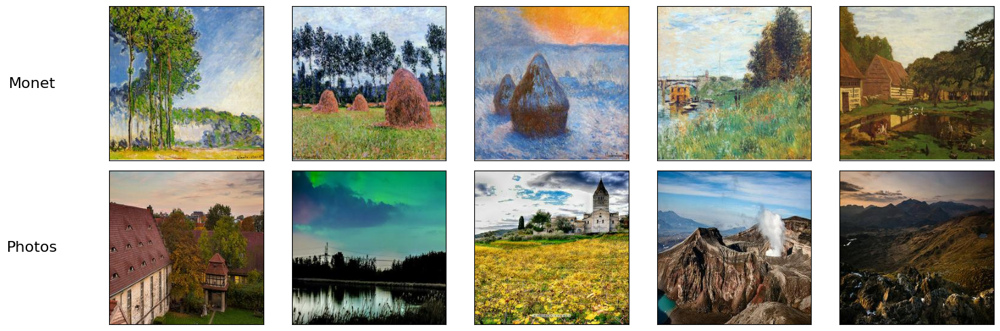

In [34]:
random_indices = np.random.randint(0, len(os.listdir(path_monet)), size=5).tolist() # between 0 and 300

fig, ax = plt.subplots(2,5, figsize=(15,5))

# Set titles for the rows
ax[0, 0].text(-0.5, 0.5, 'Monet', fontsize=16, ha='center', va='center', rotation=0, transform=ax[0, 0].transAxes)
ax[1, 0].text(-0.5, 0.5, 'Photos', fontsize=16, ha='center', va='center', rotation=0, transform=ax[1, 0].transAxes)

for i, idx in enumerate(random_indices):

    # Get photos from directories
    example_monet = os.listdir(path_monet)[idx]
    example_photo = os.listdir(path_photo)[idx]

    #ax[0,i].set_title('Monet')
    ax[0,i].imshow(Image.open(os.path.join(path_monet, example_monet)))
    ax[0,i].set_xticks([])
    ax[0,i].set_yticks([])

    ax[1,i].imshow(Image.open(os.path.join(path_photo, example_photo)))
    ax[1,i].set_xticks([])
    ax[1,i].set_yticks([])

plt.tight_layout()
plt.show()

In [20]:
# function to display the present color channels in an image alongside the image itself
def display_color_channels(path):
    plt.figure(figsize=(16, 4))
    
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    plt.subplot(1, 4, 1)
    plt.imshow(img)
    plt.axis("off")
    
    colors = ["red", "green", "blue"]
    for i in range(len(colors)):
        plt.subplot(1, 4, i + 2)
        plt.hist(
            img[:, :, i].reshape(-1),
            bins=50,
            color=colors[i],
            density=True
        )
        plt.xlim(0, 255)
        plt.xticks([])
        plt.yticks([])
     
    plt.show()

Monet:


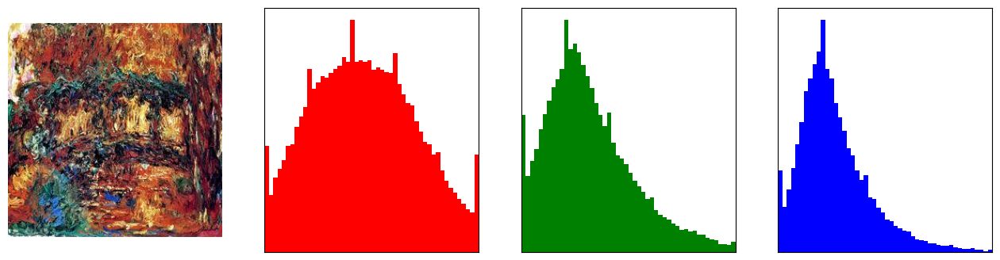

Photo:


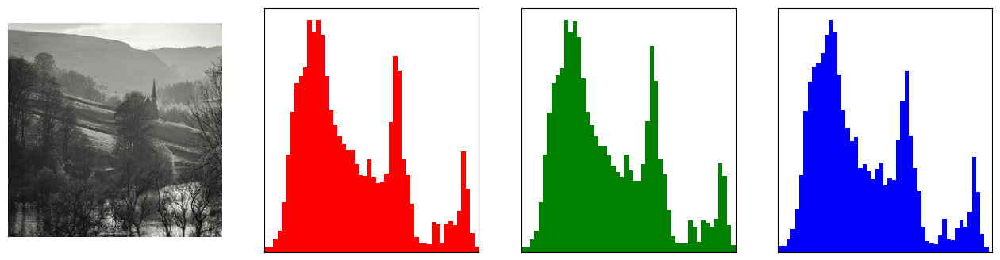

In [27]:
# show monet example color channels
print("Monet:")
display_color_channels(os.path.join(path_monet, example_monet))
print("Photo:")
display_color_channels(os.path.join(path_photo, example_photo))

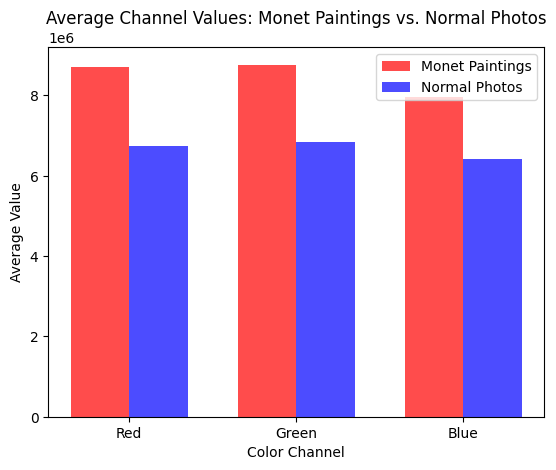

In [35]:
# function to calculate the average channel values (Red, Green, Blue)
def calculate_average_channel_values(image_dir):
    
    # init each channel (R, G, B)
    channel_sum = np.zeros(3) 
    total_images = 0

    for image_filename in os.listdir(image_dir):
        img = Image.open(os.path.join(image_dir, image_filename))
        img_array = np.array(img)
        
        # make sure it is a color image
        if img_array.shape == (256, 256, 3):
            channel_sum += np.sum(img_array, axis=(0, 1))
            total_images += 1

    average_channel_values = channel_sum / total_images
    return average_channel_values

# calculate average channel values
average_monet_values = calculate_average_channel_values(path_monet)
average_photos_values = calculate_average_channel_values(path_photo)

# ceate bar charts to compare average channel values
channels = ['Red', 'Green', 'Blue']
x = np.arange(len(channels))
width = 0.35

plt.bar(x - width/2, average_monet_values, width, label='Monet Paintings', color='r', alpha=0.7)
plt.bar(x + width/2, average_photos_values, width, label='Normal Photos', color='b', alpha=0.7)

plt.xlabel('Color Channel')
plt.ylabel('Average Value')
plt.title('Average Channel Values: Monet Paintings vs. Normal Photos')
plt.xticks(x, channels)
plt.legend()
plt.show()

# Model Building

In [23]:
IMAGE_SIZE = [256,256]

class DataLoader(Dataset):
    def __init__(self, _path, transform=True):
        self._path = _path
        # Memoize path indices for later
        self.monet_indices = dict()
        self.photo_indices = dict()

        if transform:
            # Default 0-1 norm´
            self.transform = transforms.Compose((
                transforms.Resize(IMAGE_SIZE, antialias=False),
                transforms.ToTensor(),
                
                )
            )
        self.monets = os.listdir(_path + "/monet_jpg")
        self.photos = os.listdir(_path + "/photo_jpg")

        for i, fl in enumerate(os.listdir("data/monet_jpg")):
            self.monet_indices[i] = fl
        for i, fl in enumerate(os.listdir("data/photo_jpg")):
            self.photo_indices[i] = fl

    def __len__(self):
        return min(len(self.monets), len(self.photos))

    def __getitem__(self, index):
        random_index = int(np.random.uniform(0, len(self.monet_indices.keys())))
        monet_src = Image.open(os.path.join(self._path, "monet_jpg", self.monet_indices[index % 300]))   
        photo_src = Image.open(os.path.join(self._path, "photo_jpg", self.photo_indices[random_index]))
        monet_src = self.transform(monet_src)
        photo_src = self.transform(photo_src)
        return photo_src, monet_src

dataset = DataLoader("./data")
# cur_max = 0
# for (idx, i) in enumerate(dataset):
#     # Stop after 10 images, or infinite loop
#     if (idx+1) % 300==0:
#         break

#     photo, monet = i[0],i[1]
#     for j in range(2): # col
#         for x in range(255): 
#             for y in range(255):
#                 if monet[j][x][y] < cur_max:
#                     cur_max = monet[j][x][y]
#     print(cur_max)


In [24]:
# Dummy values and boilerplate for now

class Model(torch.nn.Module):
    def __init__(self):
        super(Model,self).__init__()

    def init_weights(self):
        pass

    def train(self):
        pass

model = Model()
# loss_fn = nn.CrossEntropyLoss()
# optimizer = optim.SGD(model.parameters())